In [7]:
# Importing necessary libraries

import numpy as np
import pandas as pd
import matplotlib.pyplot as plt
import seaborn as sns
import plotly.express as px
import pyarrow.parquet as pq

import warnings
warnings.filterwarnings('ignore')

## About Dataset

### The Armed Conflict Location and Event Data Project is designed for disaggregated conflict analysis and crisis mapping. This dataset codes the dates and locations of all reported political violence and protest events in dozens of developing countries in Africa.**
 
### Political violence and protest includes events that occur within civil wars and periods of instability, public protest and regime breakdown. The dataset covers all African countries from 1997 to the present.**
<br>

These data contain information on:
- _Dates and locations of conflict events;_
- _Specific types of events including battles, civilian killings, riots, protests and recruitment activities;_
- _Events by a range of actors, including rebels, governments, militias, armed groups, protesters and civilians;_
- _Changes in territorial control; and_
- _Reported fatalities_


In [8]:
table = pq.read_table("Africa_1997-2023_Mar31.parquet")
crime = table.to_pandas(table)

TypeError: Cannot convert pyarrow.lib.Table to pyarrow.lib.MemoryPool

Exception ignored in: 'pyarrow.lib._convert_pandas_options'
TypeError: Cannot convert pyarrow.lib.Table to pyarrow.lib.MemoryPool


In [9]:
crime.head()

,EVENT_ID_CNTY,EVENT_DATE,YEAR,TIME_PRECISION,DISORDER_TYPE,EVENT_TYPE,SUB_EVENT_TYPE,ACTOR1,ASSOC_ACTOR_1,INTER1,...,LOCATION,LATITUDE,LONGITUDE,GEO_PRECISION,SOURCE,SOURCE_SCALE,NOTES,FATALITIES,TAGS,TIMESTAMP
0,ALG1,1997-01-01,1997,1,Political violence,Violence against civilians,Attack,GIA: Armed Islamic Group,None,2,...,Douaouda,36.672,2.789,1,Algeria Watch,Other,5 January: Beheading of 5 citizens in Douaouda...,5,None,1582579226
1,ALG2,1997-01-02,1997,1,Political violence,Violence against civilians,Attack,GIA: Armed Islamic Group,None,2,...,Hassasna,36.133,0.883,1,Algeria Watch,Other,Two citizens were beheaded in Hassasna.,2,None,1582579226
2,ALG3,1997-01-03,1997,1,Political violence,Violence against civilians,Attack,GIA: Armed Islamic Group,None,2,...,Hassi El Abed,34.966,-0.290,1,Algeria Watch,Other,Two citizens were killed in a raid on the vill...,2,None,1582579226
3,ALG4,1997-01-04,1997,1,Political violence,Violence against civilians,Attack,GIA: Armed Islamic Group,None,2,...,Blida,36.469,2.829,1,Algeria Watch,Other,4 January: 16 citizens were murdered in the vi...,16,None,1582579226
4,ALG5,1997-01-05,1997,1,Political violence,Violence against civilians,Attack,GIA: Armed Islamic Group,None,2,...,Douaouda,36.672,2.789,1,Algeria Watch,Other,5 January: Killing of 18 citizens in the Olivi...,18,None,1582579226


In [10]:
crime.shape

(315940, 31)

In [11]:
# Information on dataframe
crime.info()

<class 'pandas.core.frame.DataFrame'>
RangeIndex: 315940 entries, 0 to 315939
Data columns (total 31 columns):
 #   Column              Non-Null Count   Dtype         
---  ------              --------------   -----         
 0   EVENT_ID_CNTY       315940 non-null  object        
 1   EVENT_DATE          315940 non-null  datetime64[ns]
 2   YEAR                315940 non-null  int64         
 3   TIME_PRECISION      315940 non-null  int64         
 4   DISORDER_TYPE       315940 non-null  object        
 5   EVENT_TYPE          315940 non-null  object        
 6   SUB_EVENT_TYPE      315940 non-null  object        
 7   ACTOR1              315940 non-null  object        
 8   ASSOC_ACTOR_1       83943 non-null   object        
 9   INTER1              315940 non-null  int64         
 10  ACTOR2              229804 non-null  object        
 11  ASSOC_ACTOR_2       62241 non-null   object        
 12  INTER2              315940 non-null  int64         
 13  INTERACTION         315940 no

In [12]:
crime.describe()

,YEAR,TIME_PRECISION,INTER1,INTER2,INTERACTION,ISO,LATITUDE,LONGITUDE,GEO_PRECISION,FATALITIES,TIMESTAMP
count,315940.000000,315940.000000,315940.000000,315940.000000,315940.000000,315940.000000,315940.000000,315940.000000,315940.000000,315940.000000,3.159400e+05
mean,2015.608638,1.132763,3.569817,3.235178,34.009011,510.141682,6.735657,22.060978,1.279221,2.749038,1.630530e+09
std,6.542042,0.407642,1.995363,3.000550,18.841888,255.242739,16.096327,16.652754,0.501429,27.539932,3.317446e+07
min,1997.000000,1.000000,1.000000,0.000000,10.000000,12.000000,-34.710000,-25.163000,1.000000,0.000000,1.552576e+09
25%,2013.000000,1.000000,2.000000,0.000000,15.000000,231.000000,-0.317000,8.517000,1.000000,0.000000,1.618529e+09
50%,2018.000000,1.000000,3.000000,2.000000,33.000000,566.000000,6.310000,28.044000,1.000000,0.000000,1.624928e+09
75%,2021.000000,1.000000,6.000000,7.000000,55.000000,710.000000,13.420000,33.066000,2.000000,1.000000,1.654541e+09
max,2023.000000,3.000000,8.000000,8.000000,88.000000,894.000000,37.282000,63.475000,3.000000,1350.000000,1.680580e+09


# Exploratory Data Analysis

In [14]:
## Checking number of unique values per column
crime.nunique()

EVENT_ID_CNTY         315940
EVENT_DATE              9575
YEAR                      27
TIME_PRECISION             3
DISORDER_TYPE              4
EVENT_TYPE                 6
SUB_EVENT_TYPE            25
ACTOR1                  5367
ASSOC_ACTOR_1           9609
INTER1                     8
ACTOR2                  4751
ASSOC_ACTOR_2          10128
INTER2                     9
INTERACTION               43
CIVILIAN_TARGETING         1
ISO                       57
REGION                     5
COUNTRY                   57
ADMIN1                   866
ADMIN2                  5386
ADMIN3                  8013
LOCATION               34022
LATITUDE               20729
LONGITUDE              23044
GEO_PRECISION              3
SOURCE                 24808
SOURCE_SCALE              24
NOTES                 293320
FATALITIES               274
TAGS                    1055
TIMESTAMP              16116
dtype: int64

In [15]:
# Total number of fatalities per event type recorded
fatalities_per_event_type = crime.groupby(['EVENT_TYPE'])[['FATALITIES']].sum()

In [16]:
fatalities_per_event_type.sort_values(by=['FATALITIES'], axis=0, ascending=False)

,FATALITIES
EVENT_TYPE,
Battles,536107
Violence against civilians,234876
Explosions/Remote violence,72450
Riots,20194
Protests,4212
Strategic developments,692


<AxesSubplot:xlabel='EVENT_TYPE'>

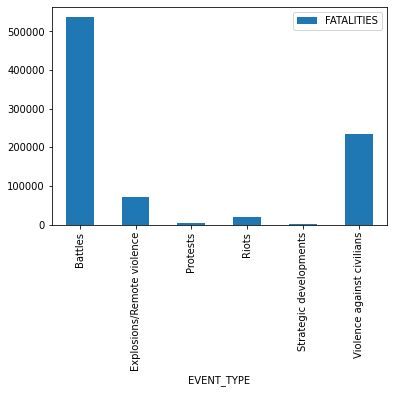

In [17]:
fatalities_per_event_type.plot(kind='bar')

In [18]:
# Exploring the total number of fatalities recorded per sub event type throught the dataset
fatalities_by_event = crime.groupby(['EVENT_TYPE', 'SUB_EVENT_TYPE'])[['FATALITIES']].sum()

In [19]:
fatalities_by_event

FATALITIES
EVENT_TYPE                 SUB_EVENT_TYPE                                 
Battles                    Armed clash                              493220
                           Government regains territory              19264
                           Non-state actor overtakes territory       23623
Explosions/Remote violence Air/drone strike                          26588
                           Chemical weapon                               8
                           Grenade                                    1822
                           Remote explosive/landmine/IED             23006
                           Shelling/artillery/missile attack         13829
                           Suicide bomb                               7197
Protests                   Excessive force against protesters         4212
                           Peaceful protest                              0
                           Protest with intervention                     0
Riots                      Mob violence                              12347
                           Violent demonstration                      7847
Strategic developments     Agreement                                     0
                           Arrests                                       0
                           Change to group/activity                      0
                           Disrupted weapons use                       595
                           Headquarters or base established              1
                           Looting/property destruction                  0
                           Non-violent transfer of territory             0
                           Other                                        96
Violence against civilians Abduction/forced disappearance                0
                           Attack                                   230306
                           Sexual violence                            4570

### It is observed from above that in Peaceful protests abductions on some other sub event types recorded, the were 0(zero) number of fatalities record. This do not then mean there was no crime, it only tells us that there was no record of fatality when the crime such event was committed.

In [20]:
## Analysing number of fatalities recorded throughout the dataset per event group.
# INTER1 is a numeric code indicating the type of ACTOR1

# Description of what each numeric code of INTER1 represents
description = {
    1: "State Forces",
    2: "Rebel Groups",
    3: "Political Militias",
    4: "Identity Militias",
    5: "Rioters",
    6: "Protesters",
    7: "Civilians",
    8: "External/Other Forces"
}

fatalities_by_actor_type = crime.groupby(['INTER1'])[['FATALITIES']].sum()

In [21]:
fatalities_by_actor_type

,FATALITIES
INTER1,
1,342205
2,200533
3,106667
4,106854
5,19408
6,3509
7,1
8,89354


In [23]:
fatalities_by_actor_type['Actor Type'] = description.values() # Column to match numeric codes with text description
actor_counts = crime.groupby('INTER1')['ACTOR1'].nunique() # Number of actors in each crime group
fatalities_by_actor_type['No. of Actors'] = actor_counts.values

In [24]:
fatalities_by_actor_type

,FATALITIES,Actor Type,No. of Actors
INTER1,,,
1,342205,State Forces,788
2,200533,Rebel Groups,331
3,106667,Political Militias,1143
4,106854,Identity Militias,2822
5,19408,Rioters,61
6,3509,Protesters,69
7,1,Civilians,23
8,89354,External/Other Forces,275


### We observed that to most number of fatalities recored by a single actor group/type fell under State Forces.

_**NOTE** - State forces are defined as collective actors that are recognised to perform government functions, including military and police, over a given territory._

In [26]:
fig = px.pie(fatalities_by_actor_type, values='FATALITIES', names='Actor Type', 
             title='Percentage of Fatalities per Type of Actors in Crimes recorded. (1997/01/01/ - 2023/03/31)',
             hover_data=['No. of Actors'])
fig.update_traces(textinfo='percent+label')
fig.show()

### This says that State Forces contributed to 39.4% of crimes(recorded) between 1997 and March 31st of 2023 in the whole of Africa

# Record of crimes per Region and Country

In [36]:
crime.groupby(['REGION'])[['FATALITIES']].sum()

,FATALITIES
REGION,
Eastern Africa,297133
Middle Africa,260766
Northern Africa,146769
Southern Africa,4231
Western Africa,159632


### A general assumption would be that the Southern part of Africa is more peaceful compared to the most hostile region, Eastern Africa

In [31]:
country_count = crime.groupby('COUNTRY')['COUNTRY'].count().sort_values(axis=0, ascending=False)
country_count

COUNTRY
Somalia                                         39620
Nigeria                                         30390
Democratic Republic of Congo                    28607
Sudan                                           19219
South Africa                                    18703
Algeria                                         12199
Egypt                                           11457
Libya                                           11092
Kenya                                           10913
Burundi                                         10186
Tunisia                                          9966
Ethiopia                                         9707
South Sudan                                      8940
Mali                                             8333
Burkina Faso                                     8318
Uganda                                           8278
Cameroon                                         7107
Morocco                                          7090
Central African Repu

<AxesSubplot:ylabel='COUNTRY'>

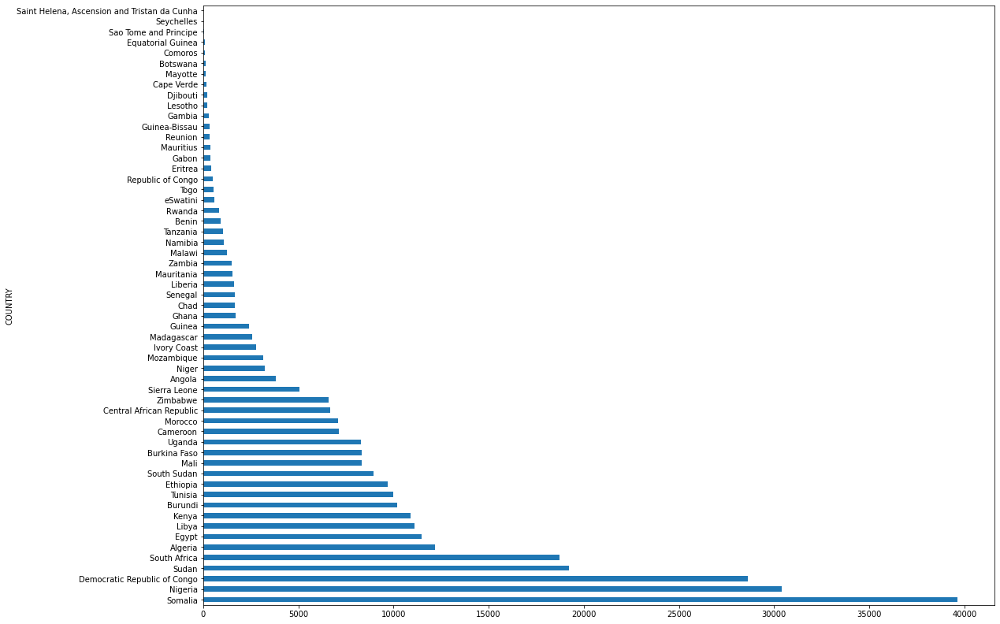

In [32]:
country_count.plot(kind='barh', figsize=(18,14))

### In terms of number of crimes recorded that have happened in each country, we can almost say that Somalia, Nigeria and the Democratic Republic of Congo have been the hotspots for crime in the past 26 years.

### While Sao Tome and Principe , Seychelles  and Saint Helena, Ascension and Tristan da Cunha have been the most peaceful with less than 30 record of crimes to have happened within the same window.

# Rate of Crime per Year

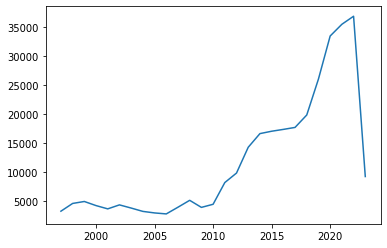

In [34]:
no_of_events_per_year = crime.groupby(['YEAR'])['YEAR'].count()
plt.plot(no_of_events_per_year.index, no_of_events_per_year.values)

### We can see the trend of number of crimes committed per year begin to increase steadily from 2009.

### There is a steep drop in total record of crimes in 2023 because the records stop at March 31st. <br> To add a bit of context, we can see that the total number of crimes recorded so far in 2023 exceeds the total recorded in 2011. This just means that the rate of crime has increased very largely over the years.

##  Record of Fatalities per Country

In [37]:
crime.groupby(['COUNTRY'])[['FATALITIES']].sum().sort_values(by=['FATALITIES'], axis=0, ascending=False)

,FATALITIES
COUNTRY,
Angola,144098
Nigeria,106234
Sudan,93039
Democratic Republic of Congo,76349
Somalia,67488
Ethiopia,65146
Eritrea,54416
South Sudan,39618
Burundi,24103


### "Angola" is a Country a case study can be built around. It has a relatively low crime rate but the highest number of fatalities.

# Visualizing hotspots of crime per year

In [39]:
import folium
from folium import plugins

In [86]:
map_df = crime[(crime['YEAR']==2022)] # Year 2022
crime_locations = list(zip(map_df.LATITUDE, map_df.LONGITUDE))

base_map = folium.Map(location=[2.318462, 19.56871], zoom_start=3)
heat_map = plugins.HeatMap(crime_locations, radius=6, blur=2)
base_map.add_child(heat_map)

# TOP 3 AND BOTTOM 3 COUNTRIES IN CRIMES RECORDED

In [69]:
# Inspecting countries with highest crime rate
conflict_count = crime["COUNTRY"].value_counts()

<AxesSubplot:>

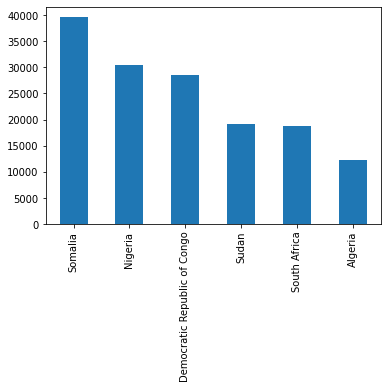

In [70]:
conflict_count.head(6).plot(kind="bar")

### Somalia, Nigeria and DRC are top 3 in crime rates.

<AxesSubplot:>

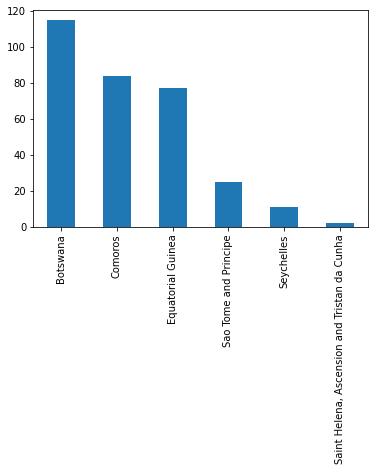

In [71]:
conflict_count.tail(6).plot(kind="bar")

### St. Helena, Seychelles, Sao Tome and Equitorial Guinea are the bottom 4 in crime rates. <br> We will not be analysing St. Helena

### Creating a pandas dataframe only containing the top 3 countries 

In [73]:
#most = data.query("COUNTRY in ('Somalia', 'Nigeria','Democratic Republic of Congo')")
top_countries = ['Somalia', 'Nigeria','Democratic Republic of Congo']

In [76]:
# Filter the DataFrame to only include data from the top 3 countries
crime_data = crime[crime['COUNTRY'].isin(top_countries)]

# Save the filtered data into a new pandas DataFrame
top_crimes = pd.DataFrame(crime_data)

In [87]:
top_countries = top_crimes.copy()

### Creating a pandas dataframe only containing the bottom 3 countries 

In [77]:
bottom_countries = ['Equatorial Guinea', 'Sao Tome and Principe','Seychelles']

In [79]:
# Filter the DataFrame to only include data from the top 3 countries
crime_data = crime[crime['COUNTRY'].isin(bottom_countries)]

# Print the filtered DataFrame
#print(crime_data)

# Save the filtered data into a new pandas DataFrame
bottom_crimes = pd.DataFrame(crime_data)

In [88]:
bottom_countries = bottom_crimes.copy()

## EDA using Pandas Profiling library

In [82]:
from pandas_profiling import ProfileReport

In [89]:
# Profile for Top 3 countries
profile_top = ProfileReport(top_countries, title="Pandas Profiling Report")

In [90]:
profile_top

The history saving thread hit an unexpected error (OperationalError('database or disk is full')).History will not be written to the database.


Summarize dataset:   0%|          | 0/5 [00:00<?, ?it/s]

Exception ignored in: <function ZipFile.__del__ at 0x7fd0e3c9a050>
Traceback (most recent call last):
  File "/Users/samuelbamgbola/opt/anaconda3/lib/python3.7/zipfile.py", line 1809, in __del__
    self.close()
  File "/Users/samuelbamgbola/opt/anaconda3/lib/python3.7/zipfile.py", line 1826, in close
    self.fp.seek(self.start_dir)
ValueError: seek of closed file


Generate report structure:   0%|          | 0/1 [00:00<?, ?it/s]

Render HTML:   0%|          | 0/1 [00:00<?, ?it/s]

In [91]:
# Profile for Bottom 3 countries
profile_bottom = ProfileReport(bottom_countries, title="Pandas Profiling Report for bottom countries")

In [92]:
profile_bottom

Summarize dataset:   0%|          | 0/5 [00:00<?, ?it/s]

Generate report structure:   0%|          | 0/1 [00:00<?, ?it/s]

Render HTML:   0%|          | 0/1 [00:00<?, ?it/s]

## Comparing Top Countries with Disorder Types

In [83]:
import seaborn as sns

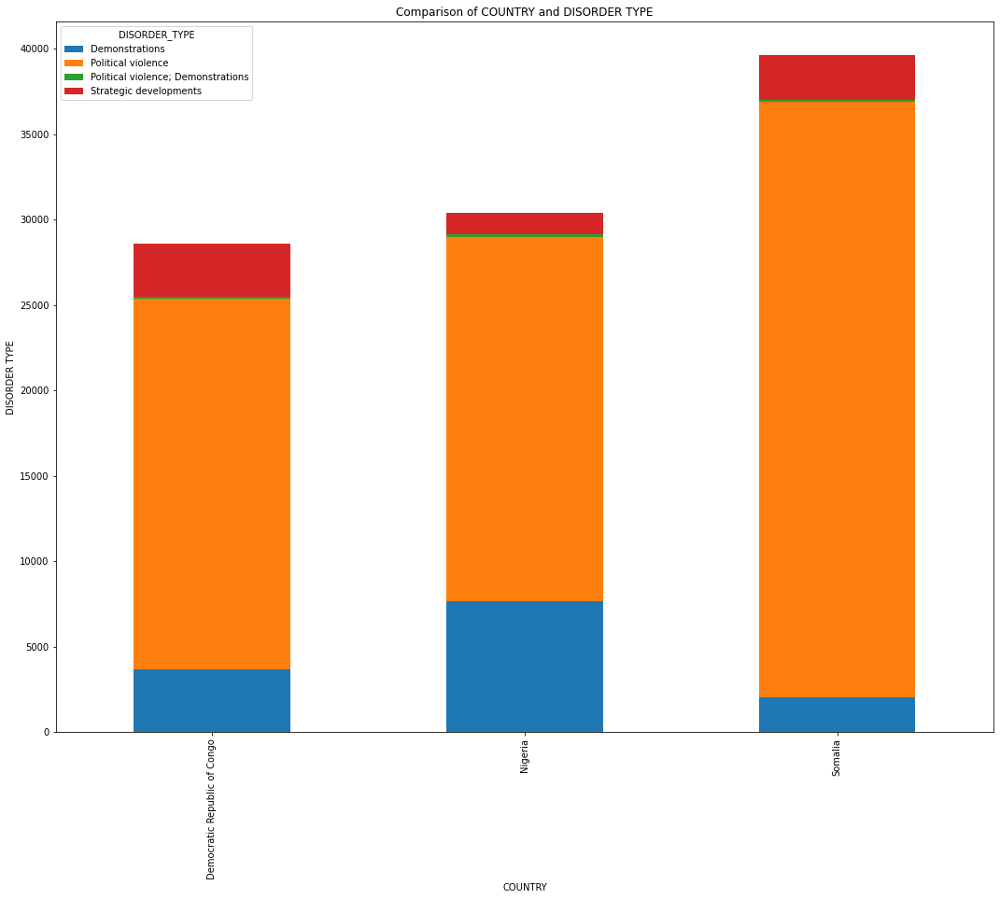

In [93]:
grouped_df = top_countries.groupby(['COUNTRY', 'DISORDER_TYPE'])['COUNTRY'].count().unstack('DISORDER_TYPE')
fig, ax = plt.subplots(figsize=(18,14)) # increase the figure size here

grouped_df.plot(kind='bar', stacked=True, ax=ax)
ax.set_xlabel('COUNTRY')
ax.set_ylabel('DISORDER TYPE')
ax.set_title('Comparison of COUNTRY and DISORDER TYPE')
plt.show()

## Comparing Bottom Countries with Disorder Types

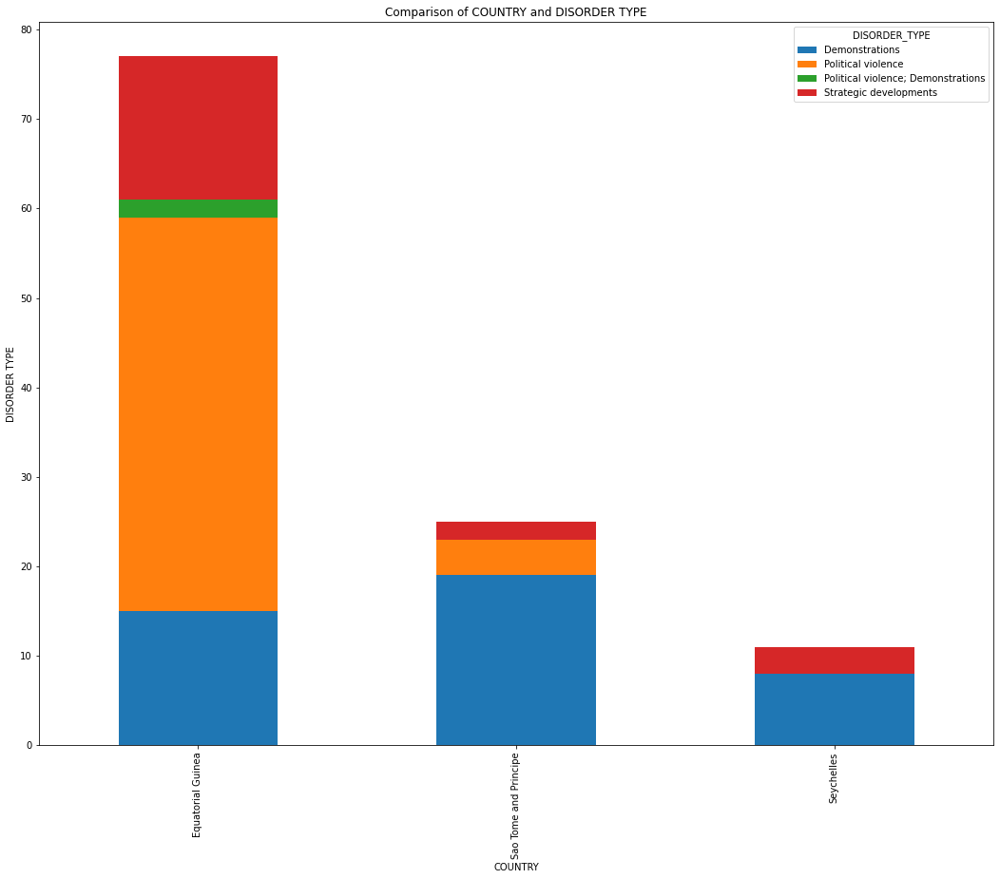

In [94]:
grouped_df = bottom_countries.groupby(['COUNTRY', 'DISORDER_TYPE'])['COUNTRY'].count().unstack('DISORDER_TYPE')
fig, ax = plt.subplots(figsize=(18,14)) # increase the figure size here

grouped_df.plot(kind='bar', stacked=True, ax=ax)
ax.set_xlabel('COUNTRY')
ax.set_ylabel('DISORDER TYPE')
ax.set_title('Comparison of COUNTRY and DISORDER TYPE')
plt.show()

## Comparing Top Countries with Event Types

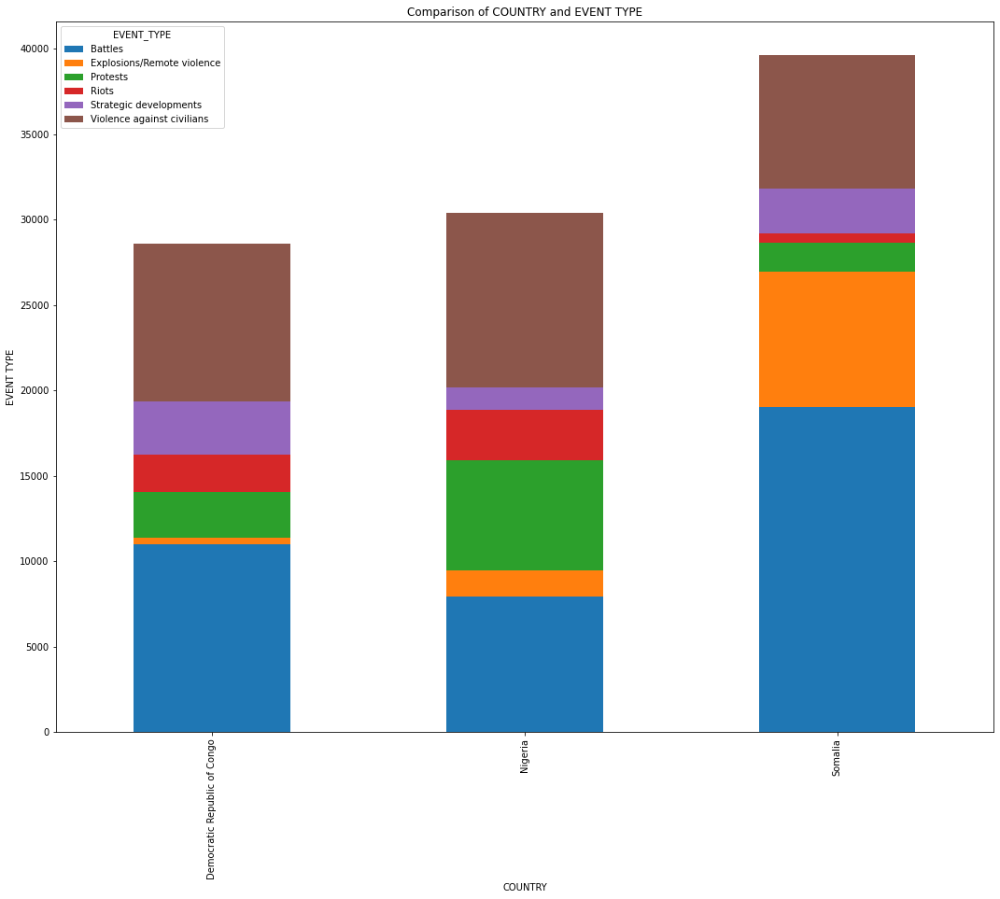

In [95]:
grouped_df = top_countries.groupby(['COUNTRY', 'EVENT_TYPE'])['COUNTRY'].count().unstack('EVENT_TYPE')
fig, ax = plt.subplots(figsize=(18,14)) # increase the figure size here

grouped_df.plot(kind='bar', stacked=True, ax=ax)
ax.set_xlabel('COUNTRY')
ax.set_ylabel('EVENT TYPE')
ax.set_title('Comparison of COUNTRY and EVENT TYPE')
plt.show()

- ## Battles was the most recorded event for the top countries.

## Comparing Bottom Countries with Event Types

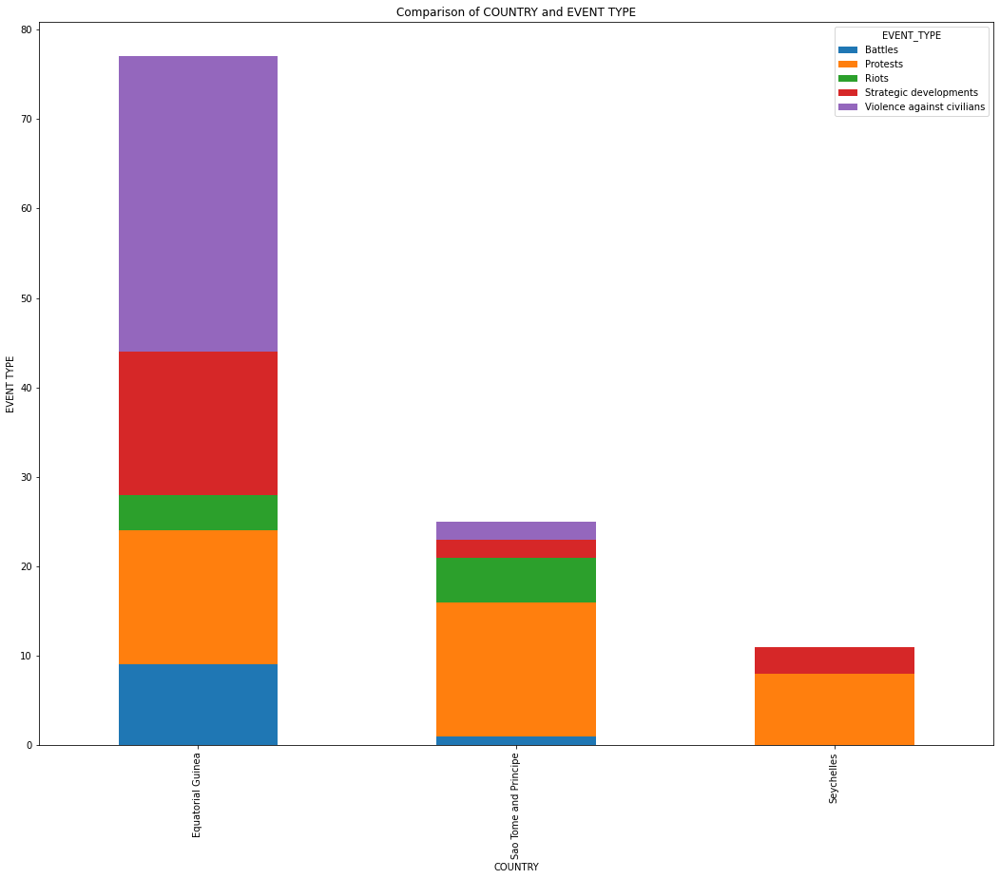

In [97]:
grouped_df = bottom_countries.groupby(['COUNTRY', 'EVENT_TYPE'])['COUNTRY'].count().unstack('EVENT_TYPE')
fig, ax = plt.subplots(figsize=(18,14)) # increase the figure size here

grouped_df.plot(kind='bar', stacked=True, ax=ax)
ax.set_xlabel('COUNTRY')
ax.set_ylabel('EVENT TYPE')
ax.set_title('Comparison of COUNTRY and EVENT TYPE')
plt.show()

- ### Violence against Civilians was the highest occuring event in Equitoial Guinea.
- ### Protests recorded relatively high numbers across the bottom 3 countries.

## Comparing influence of Actor1 groups (INTER1) on crimes committed in the Top 3 and Bottom 3 countries in terms of crime rate.

### Top Countries

<AxesSubplot:ylabel='INTER1'>

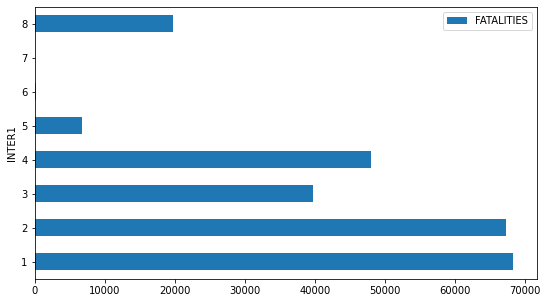

In [108]:
top_countries.groupby("INTER1")[["FATALITIES"]].sum().plot(kind="barh", figsize=(9,5))

<AxesSubplot:ylabel='INTER1'>

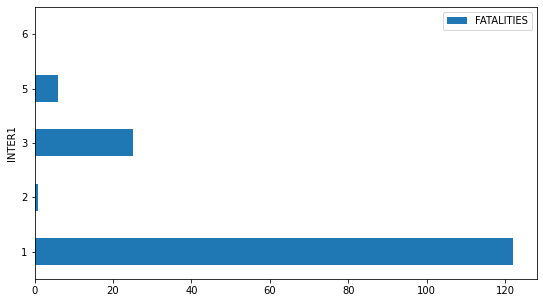

In [109]:
bottom_countries.groupby("INTER1")[["FATALITIES"]].sum().plot(kind="barh", figsize=(9,5))

- ### Group 1 responsible for most fatalities in both cases
- ### Groups 2, 3, 4 which are rare in least countries but common in high fatality areas.

## Event and Sub event types against Fatalities

<AxesSubplot:ylabel='EVENT_TYPE,SUB_EVENT_TYPE'>

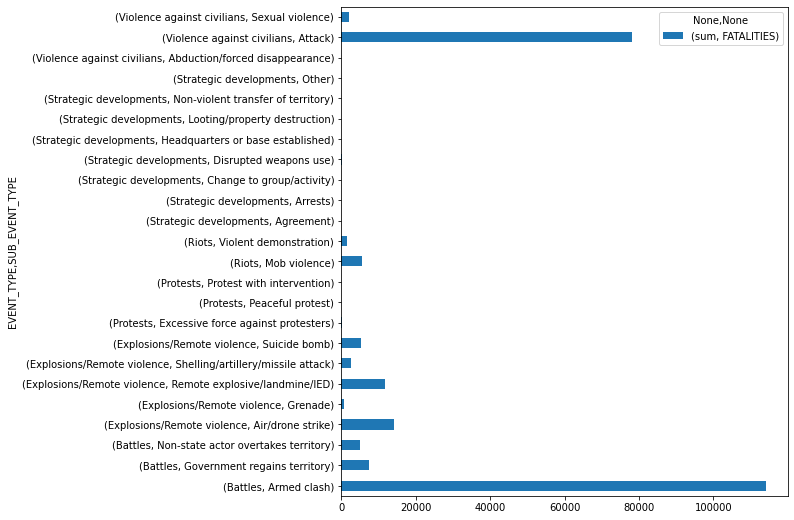

In [122]:
# Top countries
pd.pivot_table(top_countries,
              index = ["EVENT_TYPE","SUB_EVENT_TYPE"],
              values = ["FATALITIES"],
              aggfunc=["sum"]).plot.barh(figsize=(8,9))

<AxesSubplot:ylabel='EVENT_TYPE,SUB_EVENT_TYPE'>

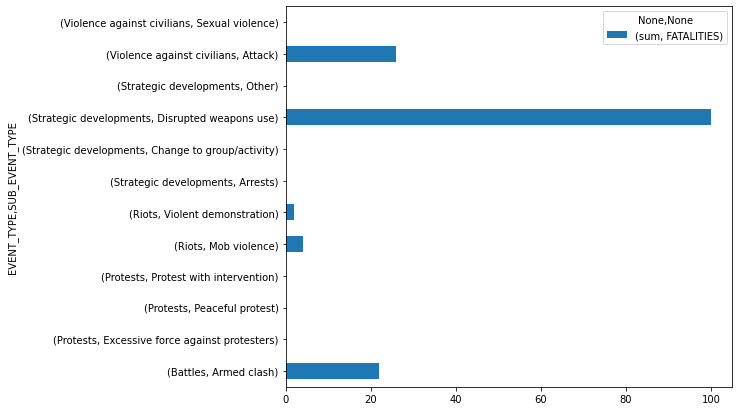

In [125]:
# Bottom countries
pd.pivot_table(bottom_countries,
              index = ["EVENT_TYPE","SUB_EVENT_TYPE"],
              values = ["FATALITIES"],
              aggfunc=["sum"]).plot.barh(figsize=(8,7))

- ### Armed clashes and attack against civlians are most prominent in countries with high number of conflict occurrences.
- ### The above events are not prominent in areas least affected by conflict.